In [60]:
import torch
import torchvision.models as models

# Define the model architecture (e.g., Faster R-CNN with ResNet-50 backbone)
model = models.detection.fasterrcnn_resnet50_fpn(num_classes = 3, pretrained=False)

In [61]:
checkpoint_path = '../model_this/semi_final.pth'
checkpoint = torch.load(checkpoint_path)

# Load the model state dictionary
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [62]:
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [63]:
import math
import random
import numpy as np
from PIL import Image

import cv2
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from tqdm import tqdm

import json

import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader

import torch
from torchvision import transforms
import torchvision.transforms.functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import fasterrcnn_resnet50_fpn, fasterrcnn_resnet50_fpn_v2
import os

In [64]:
device = torch.device("cpu")
print(f"Using device: {device}")

Using device: cpu


In [65]:
class CFG:
    
    train_batch_size = 4
    test_batch_size = 1
    
    lr = 0.0001
    lr_finetune = 0.0005
    weight_decay = 1e-4
    
    epochs = 20
    epochs_finetune = 15

cfg = CFG()

In [66]:
train_img_path = '../../data/coco/train'
train_label_file = '../../data/coco/train/_annotations.coco.json'
test_img_path = '../../data/coco/test'
test_label_file = '../../data/coco/test/_annotations.coco.json'
valid_img_path = '../../data/coco/valid'
valid_label_file = '../../data/coco/valid/_annotations.coco.json'


In [67]:
with open(test_label_file) as json_file:
    test_data_dict = json.load(json_file)
with open(valid_label_file) as json_file:
    valid_data_dict = json.load(json_file)

In [68]:
test_data_dict['annotations'][0]

{'id': 0,
 'image_id': 1,
 'category_id': 2,
 'bbox': [190, 284, 90, 155],
 'area': 13950,
 'segmentation': [],
 'iscrowd': 0}

In [69]:
cat_mapping = dict() # Variable that maps class id -> class name
for category in test_data_dict['categories']:
    cat_mapping[category['id']] = category['name']

In [70]:
class Compose(object):
    def __init__(self, transforms):
        '''
        Arguments:
        -----------
            - transforms(list): list of augmentation classes objects
        Return:
        ---------
            None
        '''
        self.transforms = transforms

    def __call__(self, image, bboxes):
        '''
        Function that iterates data through all the augmentations in the augmentation list.
        Arguments:
        -----------
            - image(PIL.Image.Image): Image.
            - bboxes(torch.Tensor): Bounding boxes related to the image.
        Return:
        ---------
            - image(PIL.Image.Image): Image after all augmentations.
            - bboxes(torch.Tensor): Bounding boxes related to the image after all augmentations.
        '''
        for t in self.transforms:
            image, bboxes = t(image, bboxes)
        return image, bboxes

    
class RandomHorizontalFlip(object):
    def __init__(self, p=0.5):
        '''
        Arguments:
        -----------
            - p(float): probability of the augmentation being applied
        Return:
        ---------
            None
        '''
        self.p = p

    def __call__(self, image, bboxes):
        '''
        Function that applies the horizontal flip.
        Arguments:
        -----------
            - image(PIL.Image.Image): Image.
            - bboxes(torch.Tensor): Bounding boxes related to the image.
        Return:
        ---------
            - image(PIL.Image.Image): Image after horizontal flip.
            - bboxes(torch.Tensor): Bounding boxes related to the image after horizontal flip.
        '''
        if random.random() < self.p:
            image = F.hflip(image)
            width, _ = image.size
            if len(bboxes)!=0:
                bboxes = bboxes.clone()
                bboxes[:, [0, 2]] = width - bboxes[:, [2, 0]]  # Flip x_min and x_max
        return image, bboxes

    
class ToTensor(object):
    def __call__(self, image, bboxes):
        '''
        Function that transforms data into torch.Tensor type.
        Arguments:
        -----------
            - image(PIL.Image.Image): Image.
            - bboxes(torch.Tensor): Bounding boxes related to the image.
        Return:
        ---------
            - image(torch.Tensor): Image as a pytorch tensor.
            - bboxes(torch.Tensor): Bounding boxes that are not changed.
        '''
        image = F.to_tensor(image)
        return image, bboxes

In [71]:
train_transform = Compose([
            RandomHorizontalFlip(p=0.5),
            ToTensor()
        ])

val_transform = Compose([
            ToTensor()
        ])

test_transform = val_transform

In [72]:
class CSGODataset(Dataset):
    def __init__(self, img_path, data_dict, transform=None):
        '''
        Arguments:
        -----------
            - images(np.ndarray): Array containing all images (X)
            - labels(np.ndarray): Array containing the targets (y)
            - lb(sklearn.preprocessing._label.LabelBinarizer): Label Binarizer to transform labels into one-hot vectors
            - transform(torchvision.transforms.transforms.Compose|None): Variable containing all transformations data has to go through
        Return:
        ---------
            None
        '''
        self.img_path = img_path
        self.data_dict = data_dict
        self.transform = transform
        self.dataset = self.create_dataset()
    
    def create_dataset(self):
        """
        Function to create dataset list, by pairing each image path to all the annotations in that image.
        Arguments:
        ---------
            None
        Return:
        ---------
            - dataset(list[list[str,dict]]): List containing the all the needed information related to the dataset.
        """
        dataset = []
        for element in self.data_dict["images"]:
            img_id = element['id']
            img_annotations = []
            for annotation in self.data_dict['annotations']:
                if annotation['image_id'] == img_id:
                    img_annotations.append(annotation)
            dataset.append([element['file_name'], img_annotations])
        
        return dataset
    
    def __len__(self):
        """
        Arguments:
        ---------
            None
        Return:
        ---------
            None
        """
        return len(self.data_dict['images'])
    
    def collate_fn(self, batch):
        """
        Since each image may have a different number of objects,
        we need a collate function (to be passed to the DataLoader).
        
        Arguments:
        ---------
            - batch: an iterable of N sets from __getitem__()
        Return:
        ---------
            - images(torch.Tensor): a tensor of batch_size images
            - boxes(list[torch.Tensor]): list with batch_size varying-size tensors of bounding boxes
            - labels(list[torch.Tensor]): list with batch_size varying-size tensors of labels
            - areas(list[torch.Tensor]): list with batch_size varying-size tensors of areas
            - image_id(list[torch.Tensor]): list with batch_size varying-size tensors of image ids
        """
        images = list()
        boxes = list()
        labels = list()
        areas = list()
        image_id = list()

        for b in batch:
            images.append(b[0])
            boxes.append(b[1])
            labels.append(b[2])
            areas.append(b[3])
            image_id.append(b[4])

        images = torch.stack(images, dim=0)

        return images, boxes, labels, areas, image_id
    
    def __getitem__(self, idx):
        """
        Arguments:
        ---------
            - idx (int): Index for selecting a sample from the dataset
        Return:
        ---------
            - img(torch.Tensor): Single image.
            - bbs(torch.Tensor): Bounding boxes related to the image.
            - cat_ids(torch.Tensor): Labels corresponding to each bounding box in the image.
            - areas(torch.Tensor): Areas of each bounding box.
            - image_id(torch.Tensor): Image ID related to each bounding box. Since all bounding boxes are from the same image, image_id is a tensor with all equal values.
        """
        
        img = cv2.imread(os.path.join(self.img_path, self.dataset[idx][0]))
        #img = img.reshape().astype(np.uint8)
            
        cat_ids = []
        bbs = []
        areas = []
        iscrowd = []
        image_id = []
        for annotation in self.dataset[idx][1]:
            cat_ids.append(annotation['category_id'])
            bbs.append(annotation['bbox'])
            areas.append(annotation['area'])
            iscrowd.append(annotation['iscrowd'])
            image_id.append(annotation['image_id'])
        cat_ids = torch.Tensor(cat_ids)
        
        areas = torch.Tensor(areas)
        iscrowd = torch.Tensor(iscrowd)
        image_id = torch.Tensor(image_id)
        
        bbs = np.array(bbs)
        for i, bb in enumerate(bbs):
            x_min, y_min, width, height = bb
            x1, y1 = x_min, y_min
            x2, y2 = x_min + width, y_min + height
            bbs[i] = np.array([x1, y1, x2, y2])
        
        bbs = torch.Tensor(bbs)
        if self.transform:
            img = Image.fromarray(img)
            img, bbs = self.transform(img, bbs)
        
        bbs = torch.from_numpy(np.array(bbs))
        cat_ids = torch.Tensor(cat_ids).long()
        
        return img, bbs, cat_ids, areas, image_id

In [73]:
test_dataset = CSGODataset(test_img_path, test_data_dict, transform=test_transform)
test_dataloader = DataLoader(test_dataset, batch_size=cfg.test_batch_size, shuffle=False, collate_fn=test_dataset.collate_fn)
valid_dataset = CSGODataset(valid_img_path, valid_data_dict, transform=test_transform)
valid_dataloader = DataLoader(valid_dataset, batch_size=cfg.test_batch_size, shuffle=False, collate_fn=valid_dataset.collate_fn)

In [74]:
def calculate_iou(box1, box2):
    """
    Function that calculates IoU metric.
    Arguments:
    ---------
        - box1(np.ndarray|list): First bounding box in the format (x_min, y_min, x_max, y_max).
        - box2(np.ndarray|list): Second bounding box in the format (x_min, y_min, x_max, y_max).
    Return:
    ---------
        - iou(float): Intersection over Union metric from the two bounding boxes.
    """
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    inter_min_x = max(x1_min, x2_min)
    inter_min_y = max(y1_min, y2_min)
    inter_max_x = min(x1_max, x2_max)
    inter_max_y = min(y1_max, y2_max)

    inter_area = max(0, inter_max_x - inter_min_x) * max(0, inter_max_y - inter_min_y)

    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    iou = inter_area / float(box1_area + box2_area - inter_area)
    return iou

In [75]:
def plot_test_predictions(image, boxes, labels, scores, class_names, true_boxes, true_labels, image_id, iou_threshold=0.7):
    """
    Plot some of the test images with predicted bounding boxes and class names.
    Colors indicate if it was a right or wrong detection.
    
    Arguments:
    ---------
        - image(torch.Tensor): Batch of images.
        - boxes(torch.Tensor): Batch of predicted bounding boxes related to the images.
        - labels(torch.Tensor): Batch of predicted labels corresponding to each bounding box.
        - scores(torch.Tensor): Batch of predicted scores corresponding to each label.
        - class_names(dict): Dict that maps each label to a class name.
        - true_boxes(torch.Tensor): Batch of true (ground truth) bounding boxes related to the images.
        - true_labels(torch.Tensor): Batch of true (ground truth) labels corresponding to each bounding box.
        - image_id(torch.Tensor): Batch of image IDs related to each bounding box.
        - iou_threshold(float): Threshold used to verify if the predicted bounding box was in the right spot or not.
    Return:
    ---------
        None
    """
    image = image.permute(1, 2, 0).numpy()
    image = (image * 255).astype(np.uint8) # Convert back to [0, 255] range
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    correct = 0.0
    bbox_correct = 0.0
    class_correct = 0.0
    total = 0.0
    for box, label, score in zip(boxes, labels, scores): # For each bounding box and label found in the image
        x1, y1, x2, y2 = map(int, box)
        match = False
        match_bb = False
        total += 1
        for true_box, true_label in zip(true_boxes, true_labels):
            if calculate_iou(box, true_box) >= iou_threshold and label == true_label: # Bounding Box and class right
                match = True
            elif calculate_iou(box, true_box) >= iou_threshold: # Bounding Box right but class wrong
                match_bb = True
        
        text = f'{class_names[int(label)]}: {score:.2f}'
        if match:
            green = (0, 255, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=green, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=green, thickness=2)
            correct += 1
            bbox_correct += 1
            class_correct += 1
        elif match_bb:
            blue = (0, 0, 255)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=blue, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=blue, thickness=2)
            correct += .5
            bbox_correct += 1
        else:
            red = (255, 0, 0)
            cv2.rectangle(image, (x1, y1), (x2, y2), color=red, thickness=2)
            cv2.putText(image, text, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.9, color=red, thickness=2)
    plt.title(f'Image {int(image_id[0])}')
    plt.imshow(image)
    plt.axis('off')
    plt.show()

  

In [76]:
def get_Predictions(dataloader):
    i = 0
    for images, bbs, labels, areas, image_id in dataloader:
        
        images = images.float().to(device)
        if(i !=0  and len(image_id) > 0):
            with torch.no_grad():
                prediction = model(images)
                
            pred_boxes = prediction[0]['boxes'].cpu().numpy()
            true_boxes = bbs[0].numpy()
            pred_labels = prediction[0]['labels'].cpu().numpy()
            true_labels = labels[0].numpy()
            pred_scores = prediction[0]['scores'].cpu().numpy()
            pred_boxes = pred_boxes[pred_scores >= 0.75].tolist()
            pred_labels = pred_labels[pred_scores >= 0.75].tolist()
            pred_scores = pred_scores[pred_scores >= 0.75].tolist()

            images = images.cpu().detach()
    
            plot_test_predictions(images[0], pred_boxes, pred_labels, pred_scores, cat_mapping, true_boxes, true_labels, image_id[0])
        i = i + 1

In [77]:
import torch
print(torch.__version__)

2.3.1+cu121


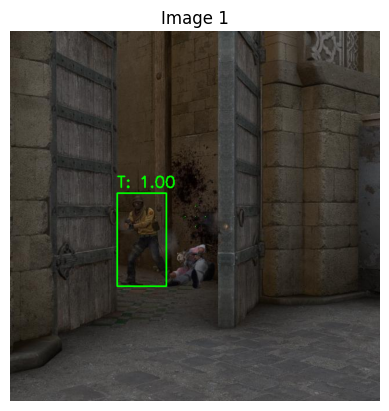

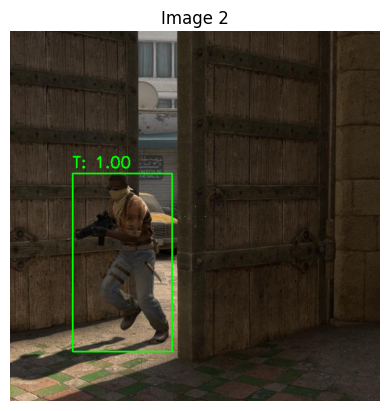

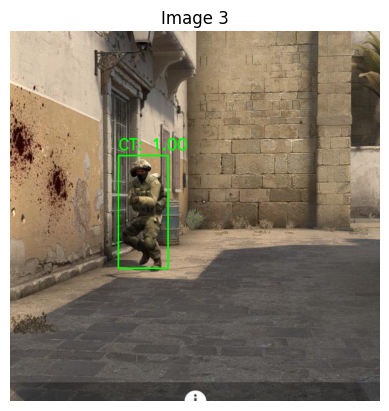

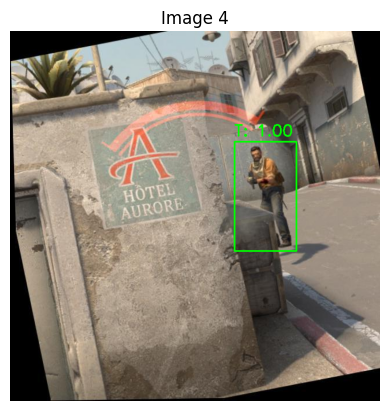

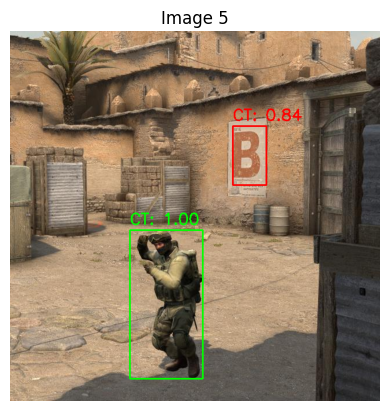

...

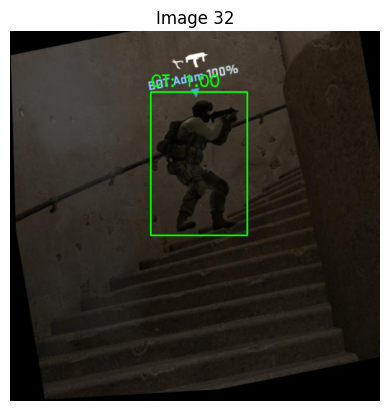

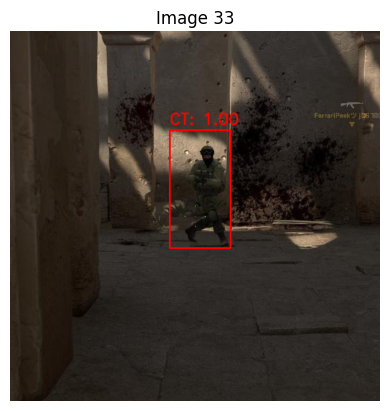

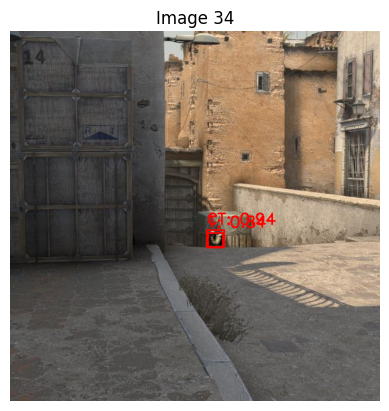

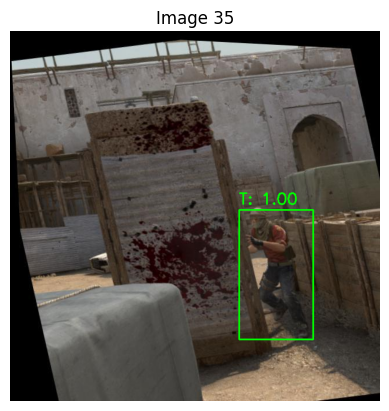

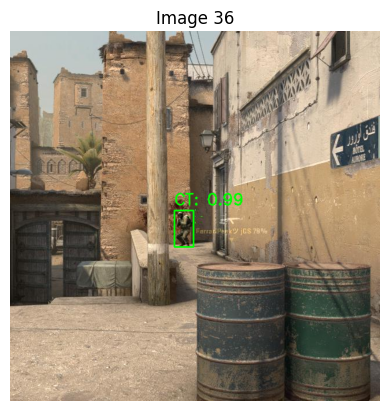

In [78]:
get_Predictions(test_dataloader)

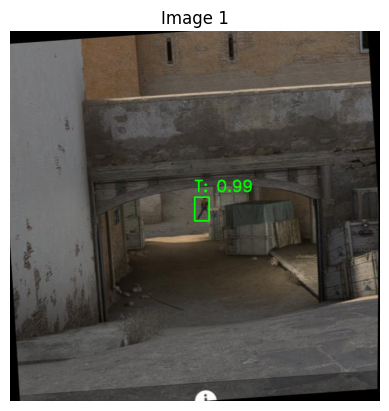

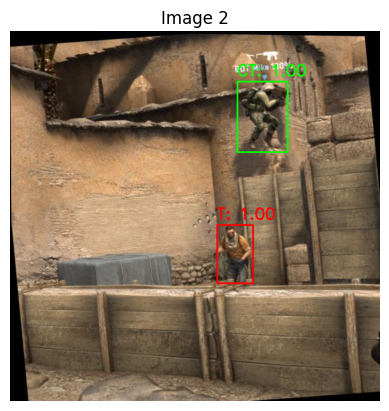

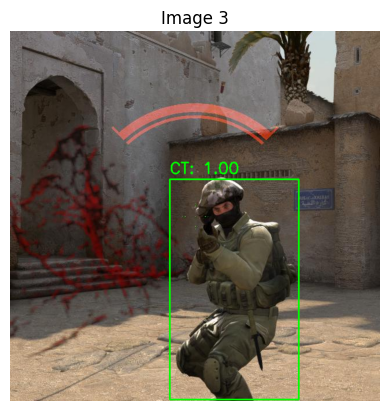

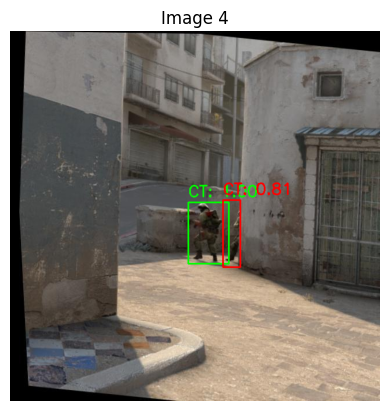

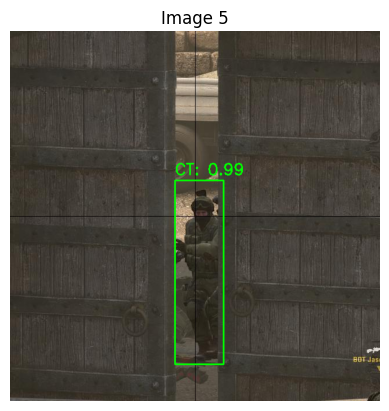

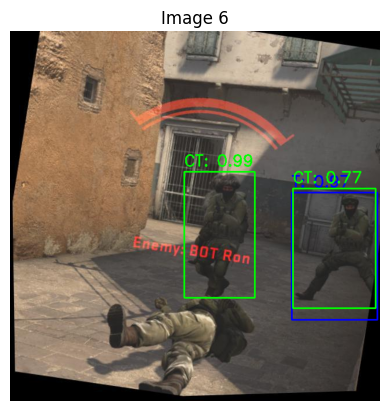

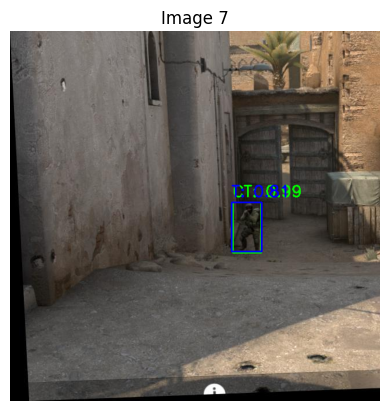

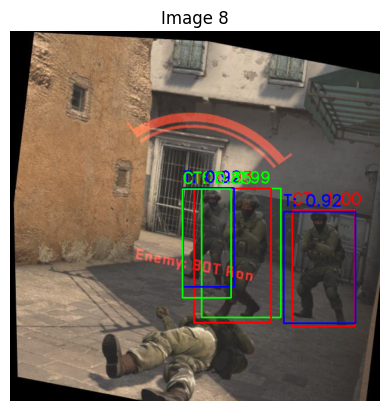

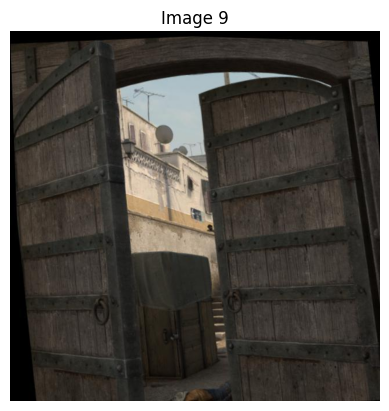

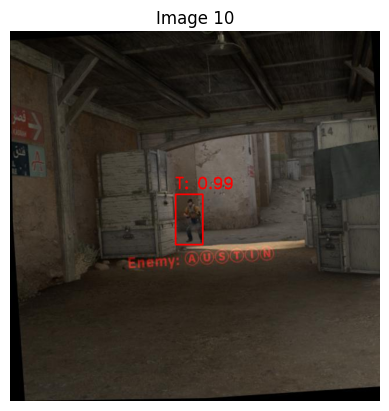

IndexError: index 0 is out of bounds for dimension 0 with size 0

In [79]:
get_Predictions(valid_dataloader)